In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import LabelEncoder, OneHotEncoder

# 2016




In [2]:
df = pd.read_csv('2013_tbi_rate_vs_matuarity.csv')
taget = 'target'
nrows , ncols = df.shape
df.head()

,Matuarity,Jan,Feb,Mar,Apr,May,June,July,Aug,Sept,Oct,Nov,Dec
0,0.5,-0.03,-0.30,-1.22,-1.28,-1.27,-1.13,-0.65,-0.30,-0.52,-1.08,-0.88,-1.03
1,1.0,-0.06,-0.30,-1.00,-1.11,-1.09,-1.01,-0.68,-0.37,-0.52,-0.95,-0.76,-0.85
2,1.5,-0.07,-0.28,-0.80,-0.96,-0.93,-0.90,-0.69,-0.42,-0.51,-0.83,-0.65,-0.68
3,2.0,-0.05,-0.25,-0.64,-0.81,-0.79,-0.79,-0.67,-0.44,-0.49,-0.72,-0.55,-0.52
4,2.5,-0.01,-0.20,-0.50,-0.69,-0.66,-0.68,-0.64,-0.42,-0.45,-0.63,-0.46,-0.38


In [3]:
df.describe()

,Matuarity,Jan,Feb,Mar,Apr,May,June,July,Aug,Sept,Oct,Nov,Dec
count,200.000000,200.00000,200.00000,200.00000,200.00000,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.00000
mean,50.250000,1.31540,1.15485,1.04050,0.92685,0.927000,0.885900,0.672900,0.665600,0.673500,0.714050,0.872600,1.02450
std,28.939592,0.37317,0.38844,0.45266,0.47082,0.463334,0.453932,0.363901,0.301236,0.313572,0.384288,0.368123,0.37483
min,0.500000,-0.07000,-0.30000,-1.22000,-1.28000,-1.270000,-1.130000,-0.690000,-0.440000,-0.520000,-1.080000,-0.880000,-1.03000
25%,25.375000,1.29000,1.14000,1.04750,0.91750,0.917500,0.870000,0.667500,0.657500,0.677500,0.720000,0.890000,1.06000
50%,50.250000,1.47000,1.31500,1.22000,1.12000,1.110000,1.070000,0.820000,0.790000,0.800000,0.870000,1.020000,1.16000
75%,75.125000,1.53250,1.38000,1.29000,1.19000,1.190000,1.140000,0.880000,0.840000,0.850000,0.920000,1.060000,1.19250
max,100.000000,1.57000,1.42000,1.32000,1.23000,1.220000,1.180000,0.910000,0.870000,0.870000,0.950000,1.080000,1.21000


In [4]:
df.cov()

,Matuarity,Jan,Feb,Mar,Apr,May,June,July,Aug,Sept,Oct,Nov,Dec
Matuarity,837.500000,8.297010,8.592299,9.483367,10.096093,9.935754,9.840678,7.927588,6.633518,6.700578,8.003103,7.393920,6.916030
Jan,8.297010,0.139256,0.144900,0.167177,0.174681,0.171815,0.168823,0.135700,0.112265,0.116783,0.142351,0.135649,0.134746
Feb,8.592299,0.144900,0.150885,0.174332,0.182015,0.179028,0.175852,0.141287,0.116838,0.121641,0.148374,0.141411,0.140563
Mar,9.483367,0.167177,0.174332,0.204901,0.212937,0.209566,0.205040,0.163266,0.134263,0.140930,0.173794,0.166221,0.167626
Apr,10.096093,0.174681,0.182015,0.212937,0.221672,0.218134,0.213640,0.170412,0.140336,0.146950,0.180754,0.172662,0.173452
May,9.935754,0.171815,0.179028,0.209566,0.218134,0.214678,0.210215,0.167603,0.137993,0.144531,0.177855,0.169897,0.170749
June,9.840678,0.168823,0.175852,0.205040,0.213640,0.210215,0.206054,0.164643,0.135734,0.141903,0.174172,0.166265,0.166562
July,7.927588,0.135700,0.141287,0.163266,0.170412,0.167603,0.164643,0.132424,0.109511,0.114051,0.139066,0.132689,0.132058
Aug,6.633518,0.112265,0.116838,0.134263,0.140336,0.137993,0.135734,0.109511,0.090743,0.094252,0.114502,0.109140,0.108108
Sept,6.700578,0.116783,0.121641,0.140930,0.146950,0.144531,0.141903,0.114051,0.094252,0.098327,0.120045,0.114672,0.114402


In [5]:
df.var()

Matuarity    837.500000
Jan            0.139256
Feb            0.150885
Mar            0.204901
Apr            0.221672
May            0.214678
June           0.206054
July           0.132424
Aug            0.090743
Sept           0.098327
Oct            0.147677
Nov            0.135515
Dec            0.140497
dtype: float64

In [6]:
df.head()

,Matuarity,Jan,Feb,Mar,Apr,May,June,July,Aug,Sept,Oct,Nov,Dec
0,0.5,-0.03,-0.30,-1.22,-1.28,-1.27,-1.13,-0.65,-0.30,-0.52,-1.08,-0.88,-1.03
1,1.0,-0.06,-0.30,-1.00,-1.11,-1.09,-1.01,-0.68,-0.37,-0.52,-0.95,-0.76,-0.85
2,1.5,-0.07,-0.28,-0.80,-0.96,-0.93,-0.90,-0.69,-0.42,-0.51,-0.83,-0.65,-0.68
3,2.0,-0.05,-0.25,-0.64,-0.81,-0.79,-0.79,-0.67,-0.44,-0.49,-0.72,-0.55,-0.52
4,2.5,-0.01,-0.20,-0.50,-0.69,-0.66,-0.68,-0.64,-0.42,-0.45,-0.63,-0.46,-0.38


In [7]:
name = df.columns[1:]

In [8]:
col = list(df)
col.remove('Matuarity')
df['sum']=(df[col].sum(axis=1))/12

In [9]:
l1=list(df['sum'])
mat = list(df.iloc[:,0])

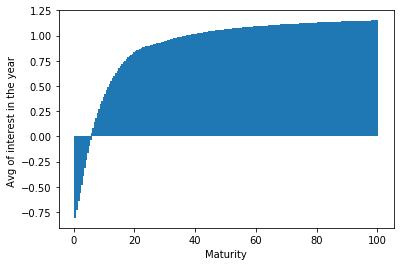

In [10]:
plt.bar(mat,l1)
plt.xlabel("Maturity")
plt.ylabel(" Avg of interest in the year  ")
plt.show()

Saturation point hence recieved is : ---> 22 weeks

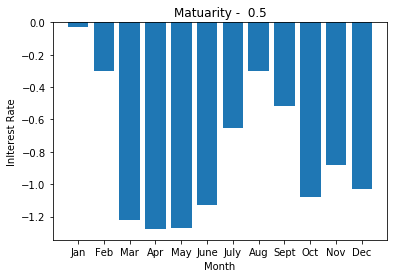

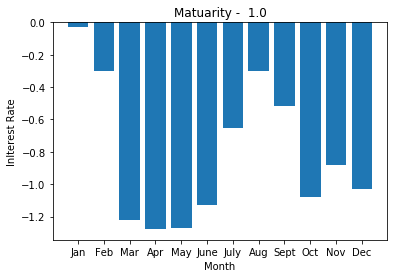

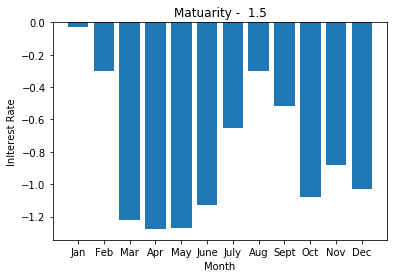

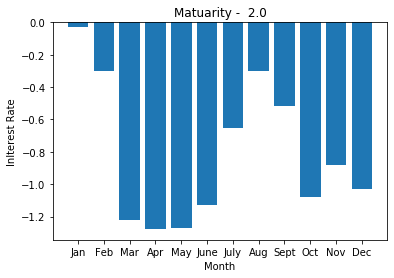

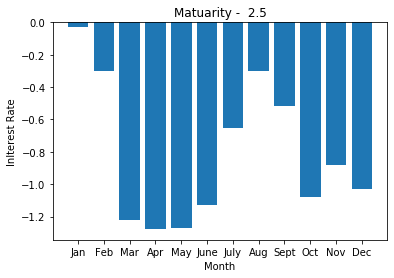

...

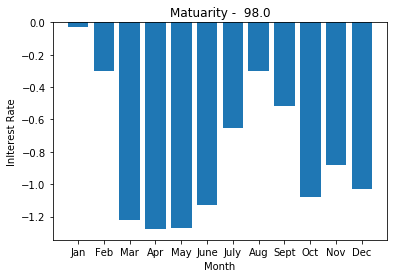

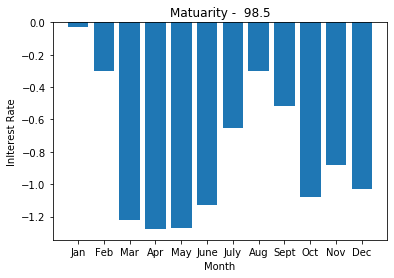

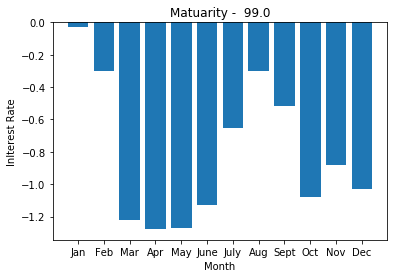

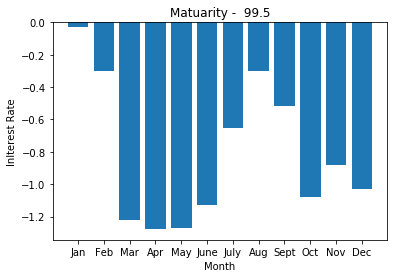

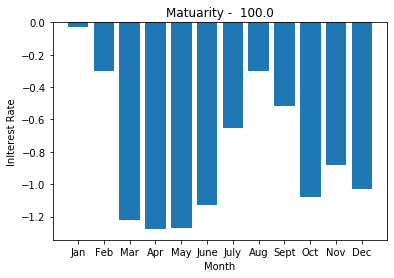

In [11]:
for i in range(0,len(df)):
    l = list(df.iloc[0,1:-1])
    plt.bar(name , l)
    plt.xlabel("Month")
    plt.ylabel("Inlterest Rate")
    plt.title("Matuarity -  "+str(df.iloc[i,0]))
    plt.show()
   

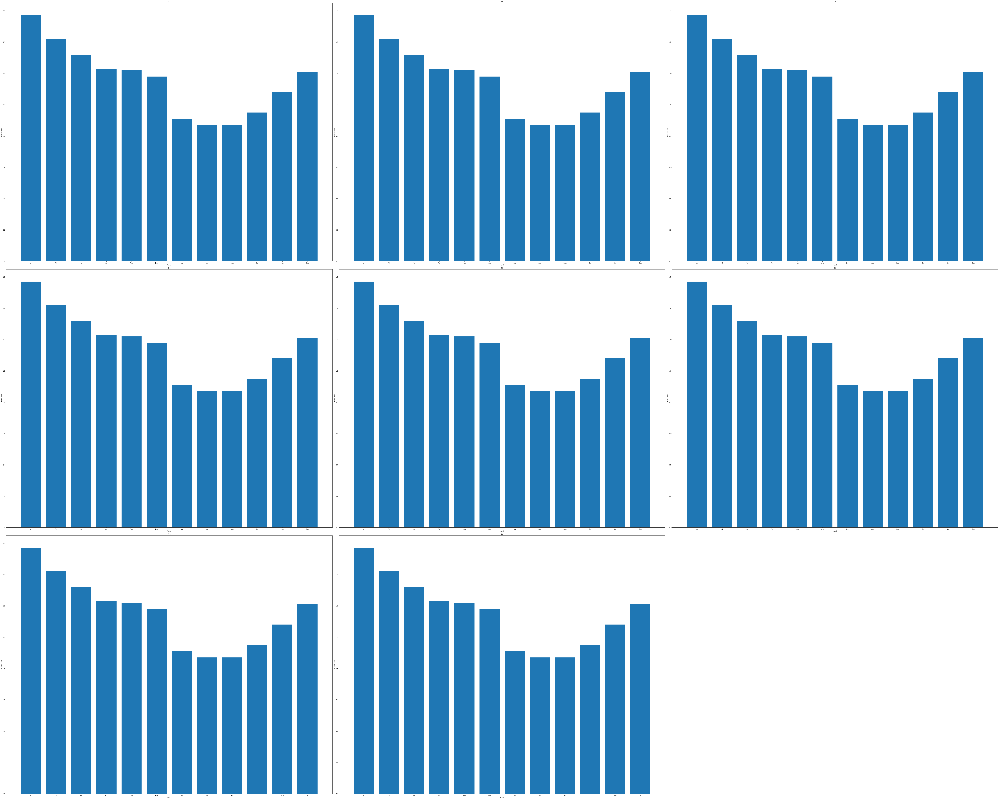

In [12]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(100,80))

for c,num in zip(mat, range(1,9)):
    df0=df[df['Matuarity']==c]
    l = list(df.iloc[i-1,1:-1])
    ax = fig.add_subplot(3,3,num)
    ax.bar(name , l)
    ax.set_xlabel("Month")
    ax.set_ylabel("Inlterest Rate")
    ax.set_title(c)

plt.tight_layout()
plt.show()

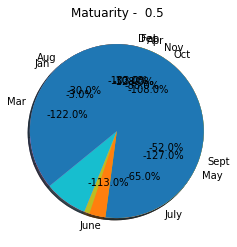

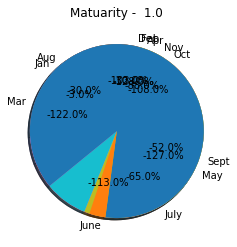

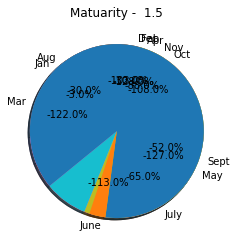

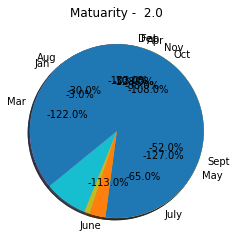

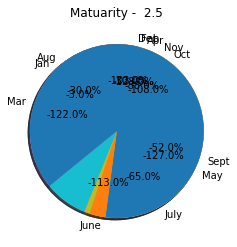

...

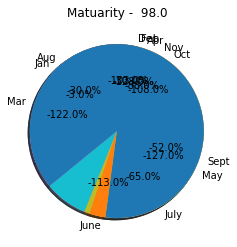

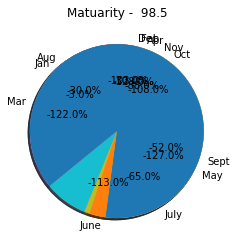

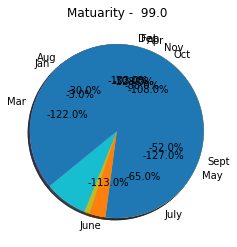

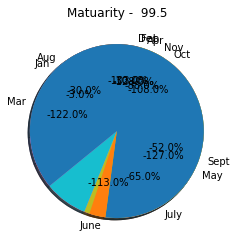

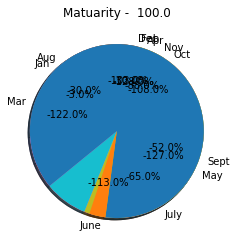

In [13]:
for i in range(0,len(df)):
    l = list(df.iloc[0,1:-1])
    plt.pie(l, labels=name, 
    autopct='%1.1f%%', shadow=True, startangle=140)
    plt.title("Matuarity -  "+str(df.iloc[i,0]))
    theme = plt.get_cmap('copper')
    plt.show()
   

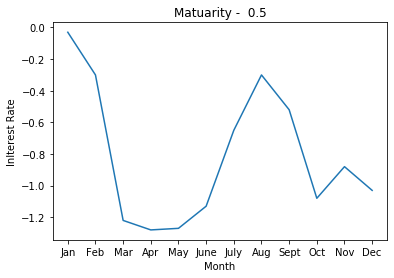

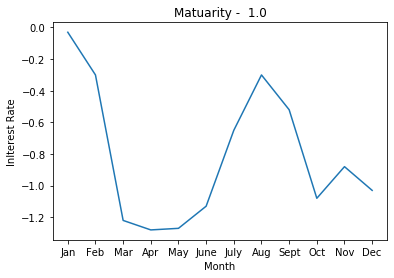

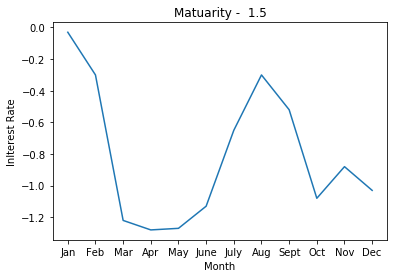

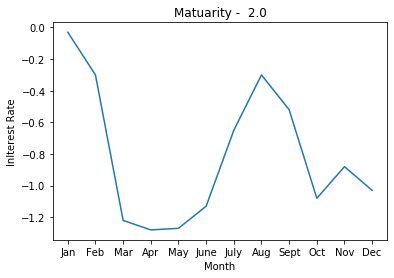

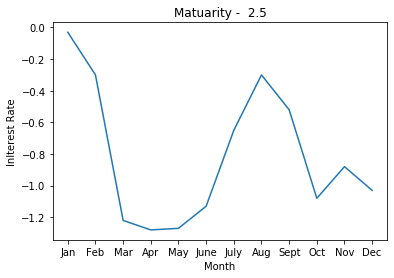

...

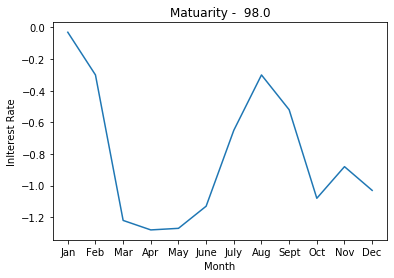

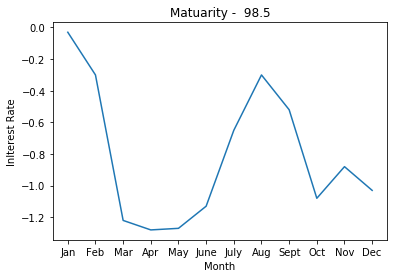

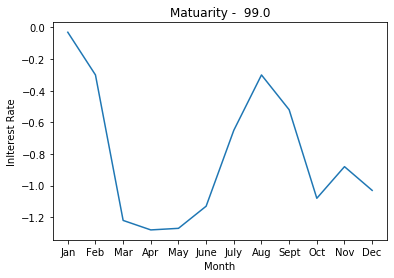

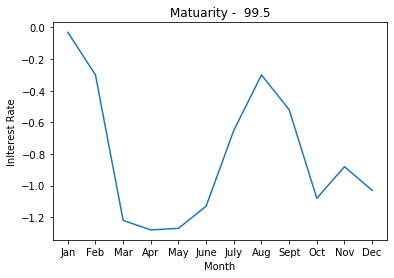

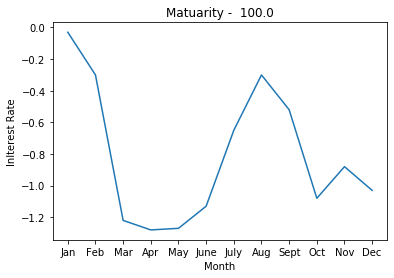

In [14]:
for i in range(0,len(df)):
    l = list(df.iloc[0,1:-1])
    plt.plot(name , l)
    plt.xlabel("Month")
    plt.ylabel("Inlterest Rate")
    plt.title("Matuarity -  "+str(df.iloc[i,0]))
    plt.show()

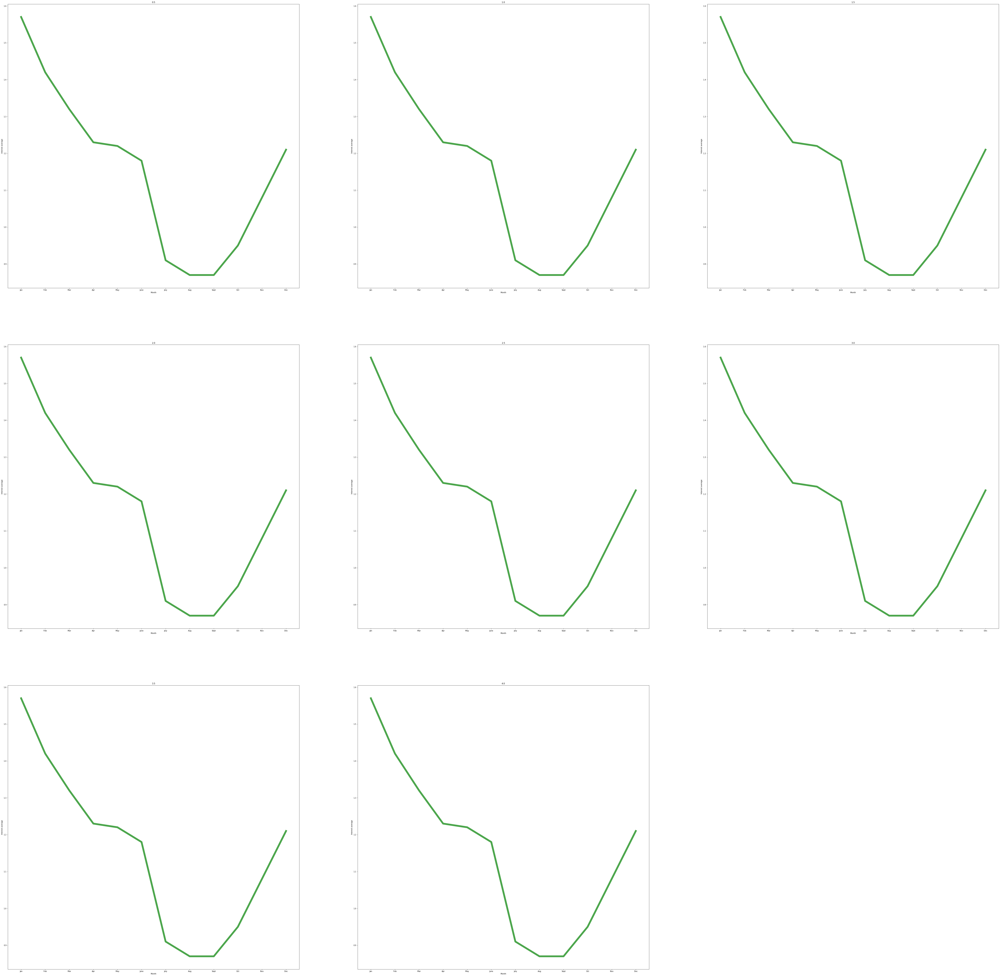

In [15]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(100,100))

for c,num in zip(mat, range(1,9)):
    df0=df[df['Matuarity']==c]
    l = list(df.iloc[i-1,1:-1])
    ax = fig.add_subplot(3,3,num)
    ax.plot(name, l ,color = 'g',linewidth=10, alpha=0.7 )
    ax.set_xlabel('Month')
    ax.set_ylabel('Interest average')
    ax.set_title(c)


plt.show()

In [16]:
df['sum'].sum()/200

0.9061375000000002